# Part 2: Pneumonia Prediction Dataset

This notebook covers:
- Exploratory Data Analysis
- CNN classifier training and evaluation
- Integrated Gradients
- Grad-CAM
- Data randomization test

The code is written to work with the common Chest X-Ray Images (Pneumonia) folder layout and can be adapted if the dataset lives elsewhere on the cluster.

In [1]:
import os
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score

sns.set_theme(style='whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['image.cmap'] = 'gray'

def seed_everything(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")
device

/opt/homebrew/lib/python3.11/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: mps


device(type='mps')

## 1. Data loading

Expected folder layout:
- `chest_xray/train/NORMAL`, `chest_xray/train/PNEUMONIA`
- `chest_xray/val/NORMAL`, `chest_xray/val/PNEUMONIA`
- `chest_xray/test/NORMAL`, `chest_xray/test/PNEUMONIA`

If the dataset is stored elsewhere on the cluster, update `DATA_ROOT_CANDIDATES` below.

In [2]:
DATA_ROOT_CANDIDATES = [
    Path.cwd() / 'chest_xray',
    Path.cwd() / 'data' / 'chest_xray',
    Path.cwd() / 'ChestXRay',
    Path.cwd().parent / 'chest_xray',
    Path.home() / 'chest_xray',
    Path.home() / 'data' / 'chest_xray',
    Path('/mnt/data/chest_xray'),
    Path('/data/chest_xray'),
    Path('/Users/Shared/chest_xray'),
    Path('/Volumes/chest_xray'),
]

def candidate_paths():
    for candidate in DATA_ROOT_CANDIDATES:
        yield candidate
    for root in [Path.home(), Path('/Users/Shared'), Path('/Volumes'), Path('/private/tmp')]:
        if root.exists():
            for name in ['chest_xray', 'ChestXRay', 'chest_xray_data']:
                for candidate in root.rglob(name):
                    yield candidate

def find_data_root():
    seen = set()
    for candidate in candidate_paths():
        if candidate in seen:
            continue
        seen.add(candidate)
        train_dir = candidate / 'train'
        test_dir = candidate / 'test'
        if train_dir.exists() and test_dir.exists():
            return candidate
    raise FileNotFoundError(
        'Could not find the Chest X-Ray dataset. Update DATA_ROOT_CANDIDATES to the correct path.'
    )

DATA_ROOT = find_data_root()
DATA_ROOT

PosixPath('/Users/rasimi./Desktop/Informatik_MSc/FS26/MLHealth/chest_xray')

In [3]:
def collect_split(split_name):
    split_dir = DATA_ROOT / split_name
    rows = []
    for class_name in ['NORMAL', 'PNEUMONIA']:
        class_dir = split_dir / class_name
        for image_path in sorted(class_dir.glob('*')):
            if image_path.suffix.lower() in {'.jpeg', '.jpg', '.png'}:
                rows.append({'path': image_path, 'label_name': class_name})
    return pd.DataFrame(rows)

train_df = collect_split('train')
val_df = collect_split('val') if (DATA_ROOT / 'val').exists() else pd.DataFrame(columns=['path', 'label_name'])
test_df = collect_split('test')

for df in [train_df, val_df, test_df]:
    if not df.empty:
        df['label'] = df['label_name'].map({'NORMAL': 0, 'PNEUMONIA': 1})

print(f'Train: {len(train_df)} images')
print(f'Val:   {len(val_df)} images')
print(f'Test:  {len(test_df)} images')
train_df.head()

Train: 5216 images
Val:   16 images
Test:  624 images


,path,label_name,label
0,/Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...,NORMAL,0
1,/Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...,NORMAL,0
2,/Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...,NORMAL,0
3,/Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...,NORMAL,0
4,/Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...,NORMAL,0


## 2. Q1: Exploratory Data Analysis

The next cells summarize the class distribution and show representative examples from both labels.

/var/folders/qg/kv4x6n11167b7qc31skhb52w0000gn/T/ipykernel_49510/675153545.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=label_counts.index, y=label_counts.values, palette=['#4C78A8', '#E45756'])


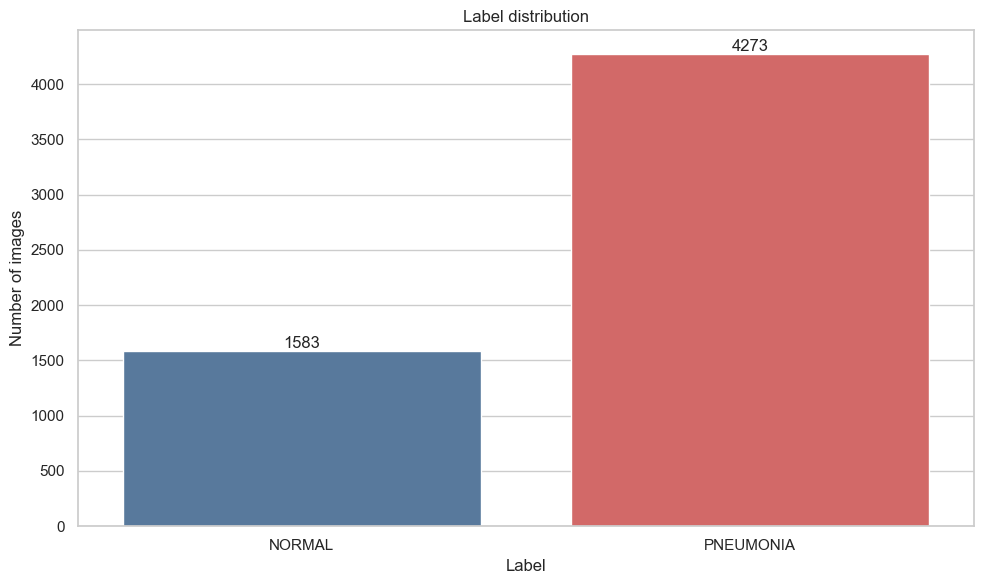

label_name,NORMAL,PNEUMONIA
split,,
test,234,390
train,1341,3875
val,8,8


In [4]:
combined_df = pd.concat([train_df.assign(split='train'), val_df.assign(split='val'), test_df.assign(split='test')], ignore_index=True)
label_order = ['NORMAL', 'PNEUMONIA']
label_counts = combined_df['label_name'].value_counts().reindex(label_order)

ax = sns.barplot(x=label_counts.index, y=label_counts.values, palette=['#4C78A8', '#E45756'])
ax.set_title('Label distribution')
ax.set_xlabel('Label')
ax.set_ylabel('Number of images')
for idx, value in enumerate(label_counts.values):
    ax.text(idx, value, str(int(value)), ha='center', va='bottom')
plt.tight_layout()
Path('figures/part2').mkdir(parents=True, exist_ok=True)
plt.savefig('figures/part2/Q1_1_label_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

combined_df.groupby(['split', 'label_name']).size().unstack(fill_value=0)

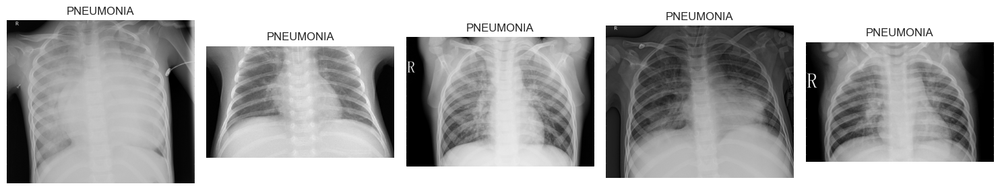

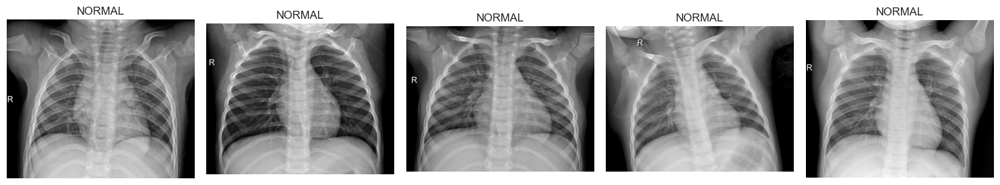

In [5]:
def show_examples(df, label_name, n=5, seed=42):
    subset = df[df['label_name'] == label_name].sample(n=min(n, len(df[df['label_name'] == label_name])), random_state=seed)
    fig, axes = plt.subplots(1, len(subset), figsize=(3 * len(subset), 3))
    if len(subset) == 1:
        axes = [axes]
    for ax, (_, row) in zip(axes, subset.iterrows()):
        image = Image.open(row['path']).convert('L')
        ax.imshow(image, cmap='gray')
        ax.set_title(label_name)
        ax.axis('off')
    plt.tight_layout()
    Path('figures/part2').mkdir(parents=True, exist_ok=True)
    filename = f"figures/part2/Q1_2_examples_{label_name.lower()}.png"
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    plt.show()

show_examples(train_df, 'PNEUMONIA', n=5)
show_examples(train_df, 'NORMAL', n=5)

In [6]:
IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 0

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.9, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]),
])

class ChestXrayDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]
        image = Image.open(row['path']).convert('L')
        if self.transform is not None:
            image = self.transform(image)
        label = torch.tensor(int(row['label']), dtype=torch.long)
        return image, label, str(row['path'])

train_dataset = ChestXrayDataset(train_df, transform=train_transform)
val_dataset = ChestXrayDataset(val_df, transform=eval_transform) if not val_df.empty else None
test_dataset = ChestXrayDataset(test_df, transform=eval_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available()) if val_dataset is not None else None
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

images, labels, paths = next(iter(train_loader))
images.shape, labels.shape

(torch.Size([32, 1, 224, 224]), torch.Size([32]))

## 3. Q2: CNN Classifier

The CNN below is intentionally compact so it trains quickly on the course setup while still being expressive enough for attribution methods.

In [7]:
class CNNClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x.squeeze(1)

model = CNNClassifier().to(device)
model

CNNClassifier(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1

In [8]:
def compute_class_weights(df):
    counts = df['label'].value_counts().sort_index()
    total = counts.sum()
    weights = torch.tensor([total / (2 * counts.get(0, 1)), total / (2 * counts.get(1, 1))], dtype=torch.float32)
    return weights

class_weights = compute_class_weights(train_df).to(device)
criterion = nn.BCEWithLogitsLoss(pos_weight=class_weights[1] / class_weights[0])
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.5)
class_weights

tensor([1.9448, 0.6730], device='mps:0')

In [9]:
def run_epoch(model, loader, optimizer=None):
    training = optimizer is not None
    model.train(training)
    losses = []
    y_true = []
    y_score = []

    for batch in loader:
        inputs, targets, _ = batch
        inputs = inputs.to(device)
        targets = targets.float().to(device)

        if training:
            optimizer.zero_grad()

        logits = model(inputs)
        loss = criterion(logits, targets)

        if training:
            loss.backward()
            optimizer.step()

        losses.append(loss.item())
        y_true.extend(targets.detach().cpu().numpy().tolist())
        y_score.extend(torch.sigmoid(logits).detach().cpu().numpy().tolist())

    y_pred = [1 if score >= 0.5 else 0 for score in y_score]
    metrics = {
        'loss': float(np.mean(losses)),
        'accuracy': accuracy_score(y_true, y_pred),
        'auc': roc_auc_score(y_true, y_score) if len(set(y_true)) > 1 else float('nan'),
    }
    return metrics

def train_model(model, train_loader, val_loader=None, epochs=10):
    history = []
    best_state = None
    best_val_loss = float('inf')

    for epoch in range(1, epochs + 1):
        train_metrics = run_epoch(model, train_loader, optimizer=optimizer)
        if val_loader is not None:
            val_metrics = run_epoch(model, val_loader, optimizer=None)
            scheduler.step(val_metrics['loss'])
            record = {'epoch': epoch, **{f'train_{k}': v for k, v in train_metrics.items()}, **{f'val_{k}': v for k, v in val_metrics.items()}}
            if val_metrics['loss'] < best_val_loss:
                best_val_loss = val_metrics['loss']
                best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            record = {'epoch': epoch, **{f'train_{k}': v for k, v in train_metrics.items()}}
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        history.append(record)
        print(record)

    if best_state is not None:
        model.load_state_dict(best_state)
    return pd.DataFrame(history)

history = train_model(model, train_loader, val_loader=val_loader, epochs=8)
history

{'epoch': 1, 'train_loss': 0.16991491871743114, 'train_accuracy': 0.8610046012269938, 'train_auc': 0.9328936037141277, 'val_loss': 1.1104358434677124, 'val_accuracy': 0.625, 'val_auc': 0.765625}
{'epoch': 2, 'train_loss': 0.12709622727307074, 'train_accuracy': 0.9008819018404908, 'train_auc': 0.9616074667436434, 'val_loss': 1.3047629594802856, 'val_accuracy': 0.5, 'val_auc': 0.828125}
{'epoch': 3, 'train_loss': 0.10985392873729664, 'train_accuracy': 0.9148773006134969, 'train_auc': 0.9719637247119386, 'val_loss': 0.5007182359695435, 'val_accuracy': 0.8125, 'val_auc': 0.890625}
{'epoch': 4, 'train_loss': 0.09478174905332686, 'train_accuracy': 0.9302147239263804, 'train_auc': 0.9782940992518823, 'val_loss': 1.0164662599563599, 'val_accuracy': 0.5625, 'val_auc': 0.890625}
{'epoch': 5, 'train_loss': 0.09010538076010584, 'train_accuracy': 0.932707055214724, 'train_auc': 0.9810648769574943, 'val_loss': 0.3667604327201843, 'val_accuracy': 0.5625, 'val_auc': 0.921875}
{'epoch': 6, 'train_loss'

,epoch,train_loss,train_accuracy,train_auc,val_loss,val_accuracy,val_auc
0,1,0.169915,0.861005,0.932894,1.110436,0.6250,0.765625
1,2,0.127096,0.900882,0.961607,1.304763,0.5000,0.828125
2,3,0.109854,0.914877,0.971964,0.500718,0.8125,0.890625
3,4,0.094782,0.930215,0.978294,1.016466,0.5625,0.890625
4,5,0.090105,0.932707,0.981065,0.366760,0.5625,0.921875
5,6,0.090192,0.928489,0.980452,0.229718,0.6875,0.906250
6,7,0.072900,0.941526,0.987438,0.475259,0.8125,0.906250
7,8,0.074465,0.943635,0.986640,0.268943,0.7500,0.921875


In [10]:
def evaluate(model, loader):
    model.eval()
    y_true, y_pred, y_score = [], [], []
    paths = []
    with torch.no_grad():
        for inputs, targets, batch_paths in loader:
            inputs = inputs.to(device)
            logits = model(inputs)
            probs = torch.sigmoid(logits)
            y_true.extend(targets.numpy().tolist())
            y_score.extend(probs.cpu().numpy().tolist())
            y_pred.extend((probs >= 0.5).long().cpu().numpy().tolist())
            paths.extend(batch_paths)
    metrics = {
        'accuracy': accuracy_score(y_true, y_pred),
        'auc': roc_auc_score(y_true, y_score) if len(set(y_true)) > 1 else float('nan'),
    }
    return metrics, pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'y_score': y_score, 'path': paths})

test_metrics, test_predictions = evaluate(model, test_loader)
test_metrics, test_predictions.head()

({'accuracy': 0.8028846153846154, 'auc': 0.9417050186280956},
    y_true  y_pred   y_score                                               path
 0       0       0  0.004207  /Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...
 1       0       0  0.004940  /Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...
 2       0       0  0.001231  /Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...
 3       0       0  0.006177  /Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...
 4       0       0  0.000480  /Users/rasimi./Desktop/Informatik_MSc/FS26/MLH...)

              precision    recall  f1-score   support

      NORMAL       0.67      0.94      0.78       234
   PNEUMONIA       0.95      0.72      0.82       390

    accuracy                           0.80       624
   macro avg       0.81      0.83      0.80       624
weighted avg       0.85      0.80      0.81       624



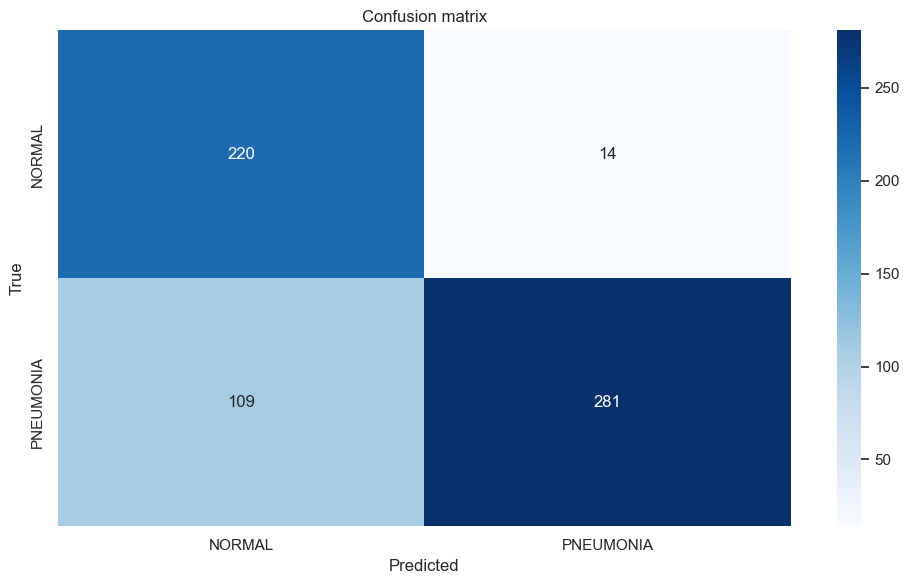

In [11]:
print(classification_report(test_predictions['y_true'], test_predictions['y_pred'], target_names=['NORMAL', 'PNEUMONIA']))
cm = confusion_matrix(test_predictions['y_true'], test_predictions['y_pred'])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['NORMAL', 'PNEUMONIA'], yticklabels=['NORMAL', 'PNEUMONIA'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion matrix')
plt.tight_layout()
Path('figures/part2').mkdir(parents=True, exist_ok=True)
plt.savefig('figures/part2/Q2_2_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

## 4. Q3: Integrated Gradients

The implementation below computes attributions for a single input image using a zero baseline by default. You can change the baseline to compare how the maps change.

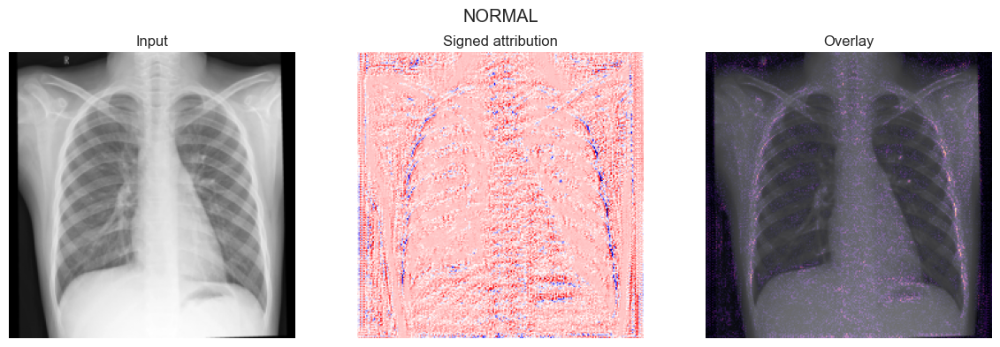

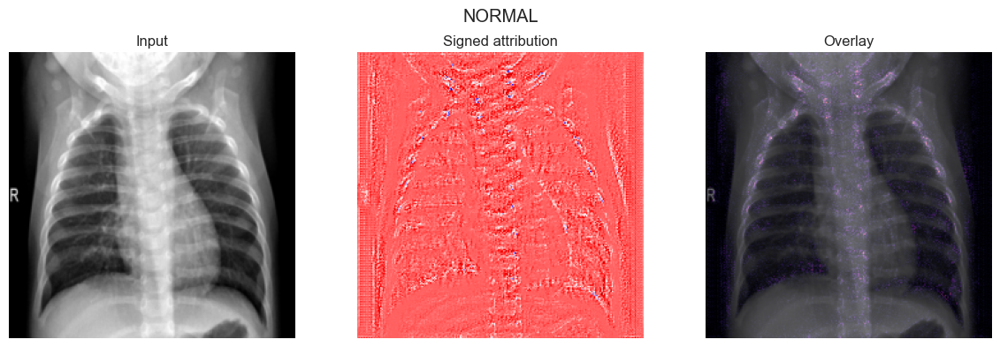

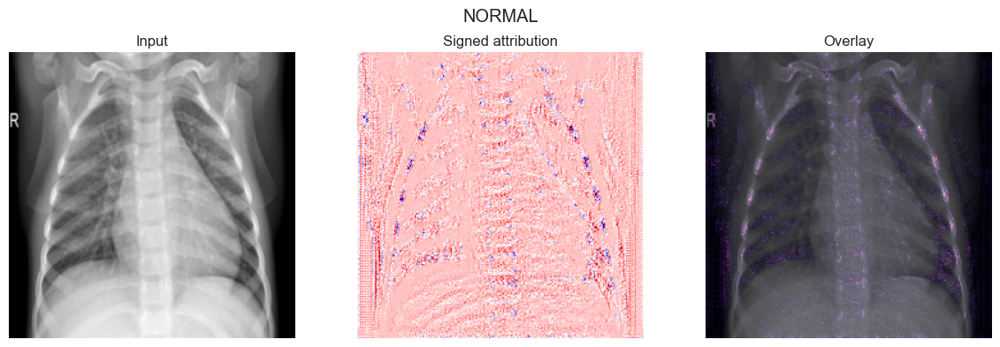

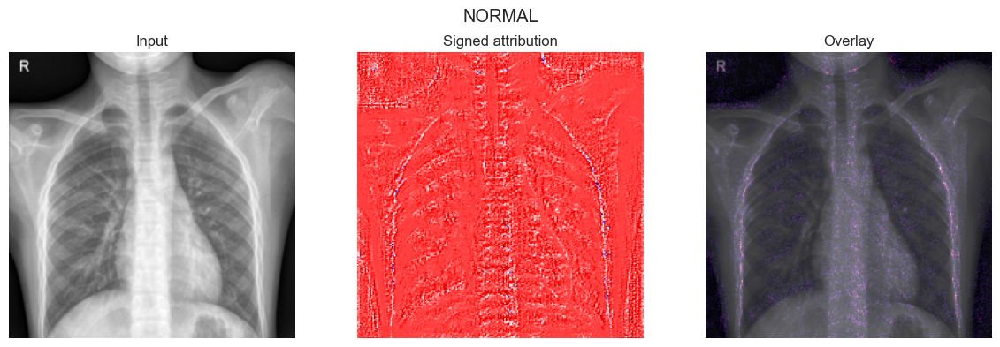

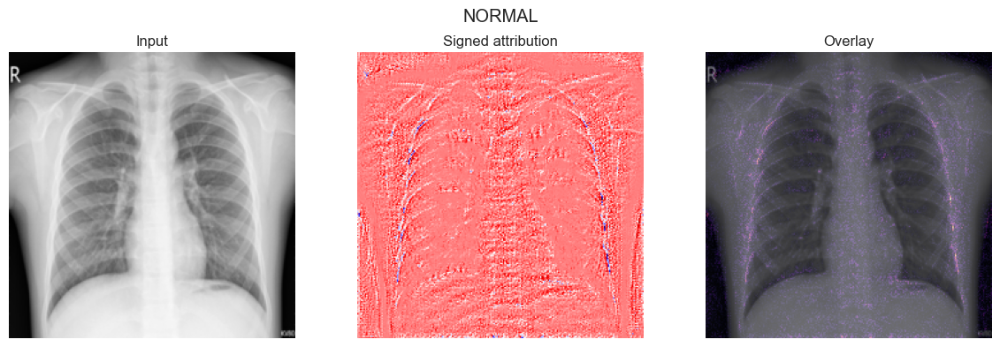

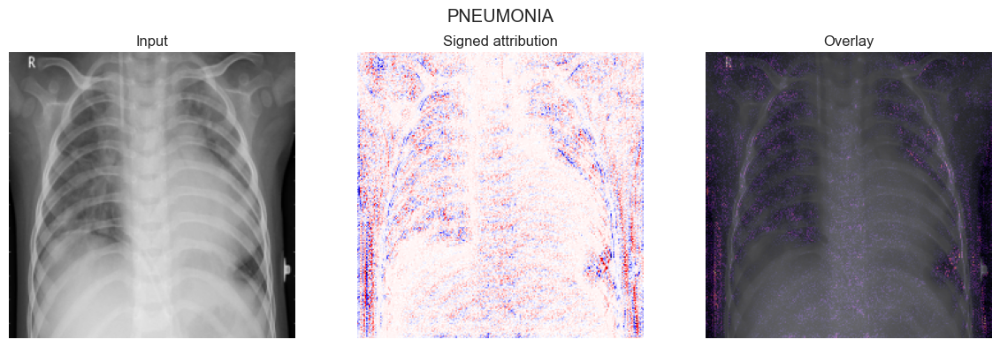

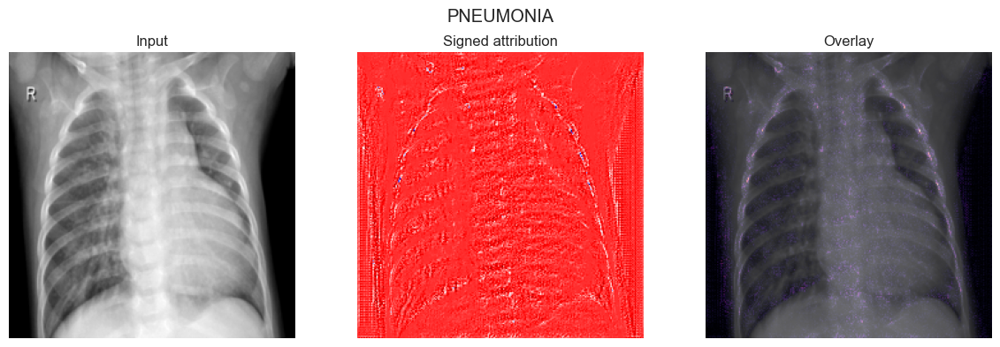

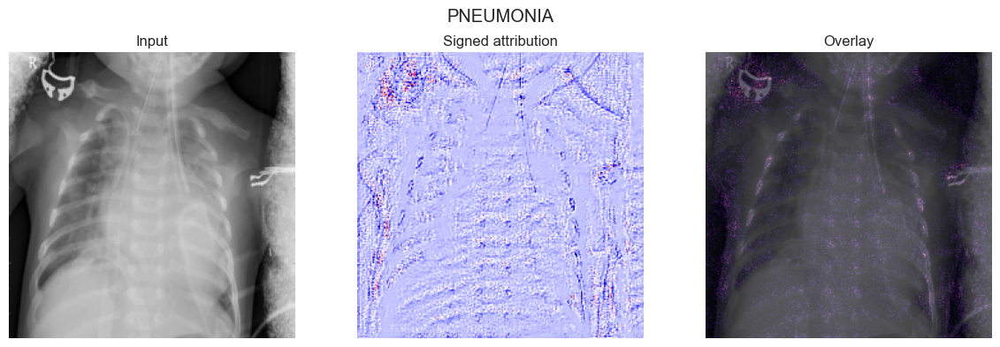

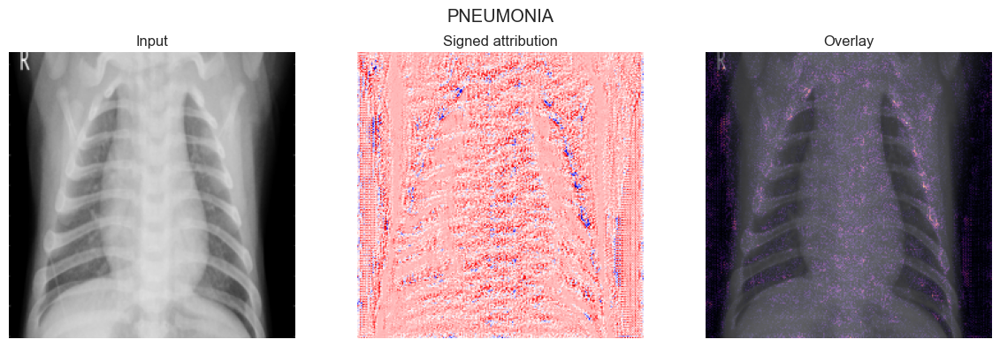

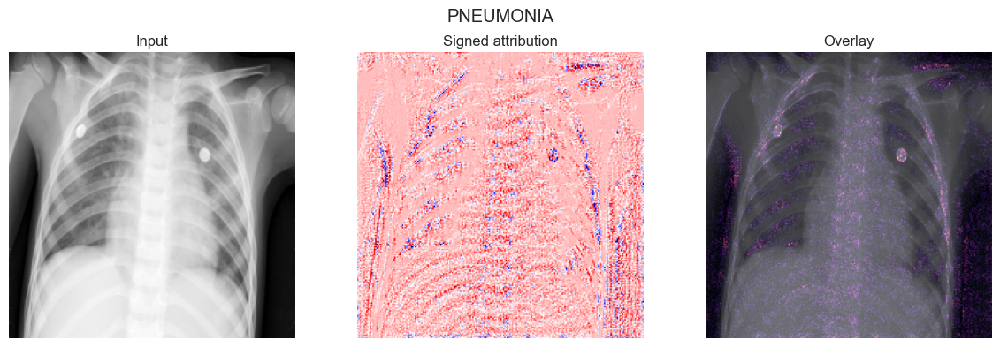

In [12]:
def integrated_gradients(model, input_tensor, baseline=None, target_class=1, steps=64):
    model.eval()
    input_tensor = input_tensor.to(device)
    if baseline is None:
        baseline = torch.zeros_like(input_tensor)
    else:
        baseline = baseline.to(device)

    scaled_inputs = [baseline + (float(i) / steps) * (input_tensor - baseline) for i in range(1, steps + 1)]
    gradients = []

    for scaled in scaled_inputs:
        scaled = scaled.clone().detach().requires_grad_(True)
        model.zero_grad()
        logits = model(scaled)
        if logits.ndim == 0:
            logits = logits.unsqueeze(0)
        target_logit = logits[:, target_class] if logits.ndim > 1 else logits
        if target_logit.ndim == 0:
            target_logit = target_logit.unsqueeze(0)
        score = target_logit.sum()
        score.backward()
        gradients.append(scaled.grad.detach())

    avg_gradients = torch.stack(gradients).mean(dim=0)
    attributions = (input_tensor - baseline) * avg_gradients
    return attributions.detach().cpu()

def denormalize(tensor):
    return tensor * 0.5 + 0.5

def plot_attribution(image_tensor, attribution, title='', save_path=None):
    image = denormalize(image_tensor.detach().cpu()).squeeze().numpy()
    attr = attribution.squeeze().numpy()
    attr_abs = np.abs(attr)
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Input')
    axes[1].imshow(attr, cmap='seismic')
    axes[1].set_title('Signed attribution')
    axes[2].imshow(image, cmap='gray')
    axes[2].imshow(attr_abs, cmap='magma', alpha=0.55)
    axes[2].set_title('Overlay')
    for ax in axes:
        ax.axis('off')
    fig.suptitle(title)
    plt.tight_layout()
    if save_path is not None:
        Path('figures/part2').mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

def get_sample_by_label(df, label_name, n=5, seed=42):
    return df[df['label_name'] == label_name].sample(n=min(n, len(df[df['label_name'] == label_name])), random_state=seed)

healthy_samples = get_sample_by_label(test_df, 'NORMAL', n=5)
disease_samples = get_sample_by_label(test_df, 'PNEUMONIA', n=5)

for idx, (_, row) in enumerate(pd.concat([healthy_samples, disease_samples]).iterrows()):
    image = Image.open(row['path']).convert('L')
    tensor = eval_transform(image).unsqueeze(0).to(device)
    attribution = integrated_gradients(model, tensor, baseline=torch.zeros_like(tensor), target_class=1, steps=32)
    label_short = 'normal' if row['label_name'] == 'NORMAL' else 'pneumonia'
    save_path = f"figures/part2/Q3_2_integrated_gradients_{label_short}_{idx}.png"
    plot_attribution(tensor, attribution, title=row['label_name'], save_path=save_path)

## 5. Q4: Grad-CAM

Grad-CAM uses gradients flowing into the last convolutional block. The model below exposes the final feature map needed for the visualization.

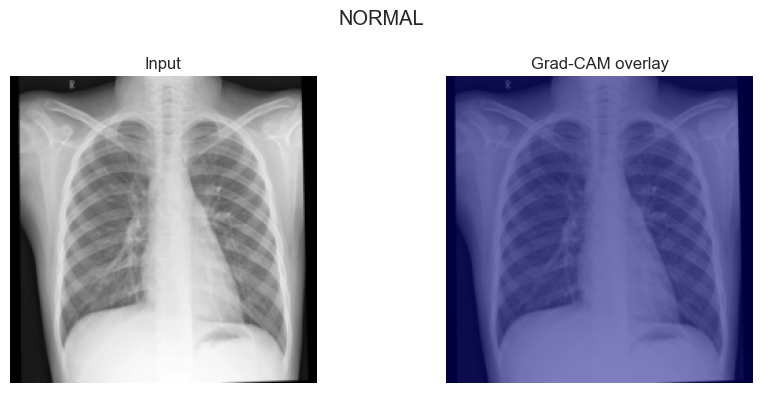

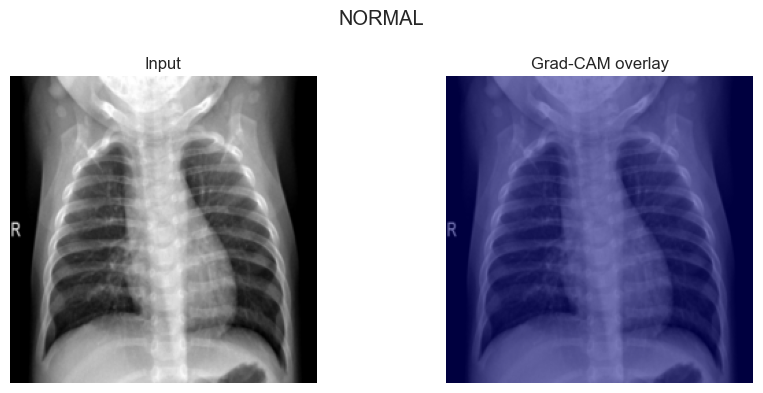

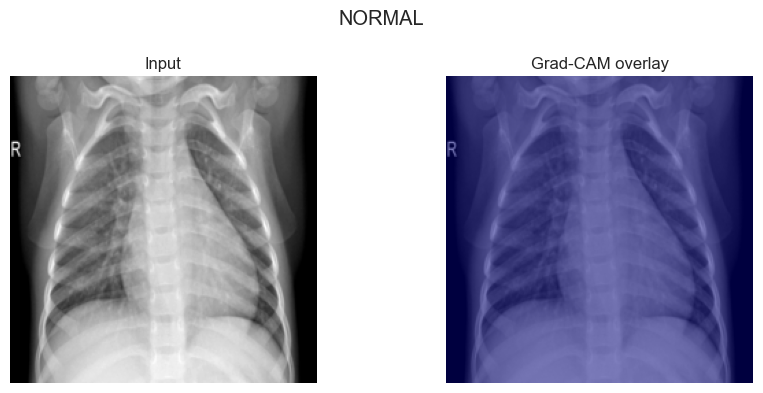

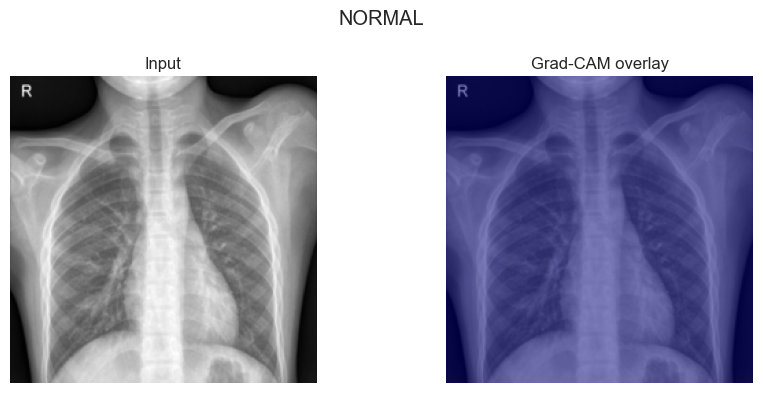

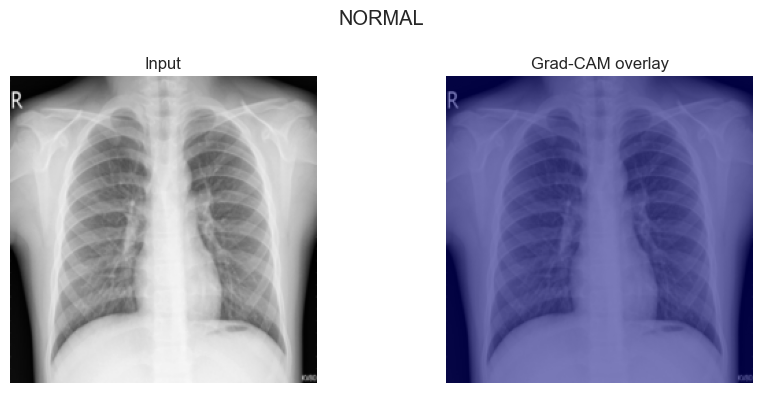

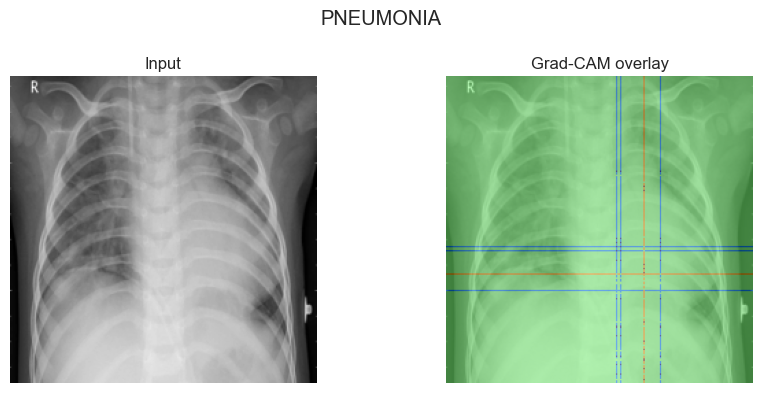

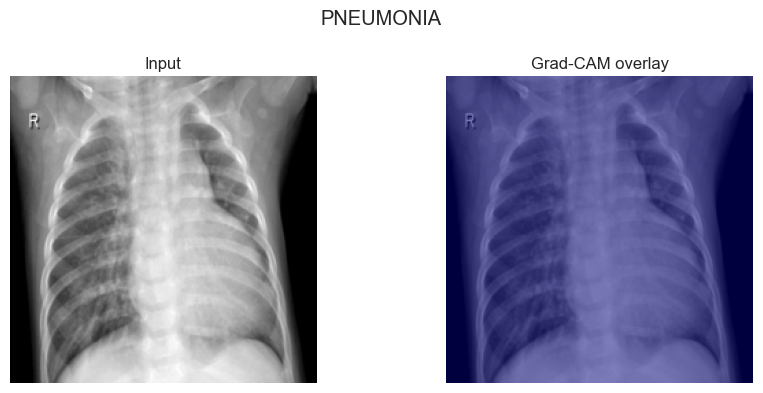

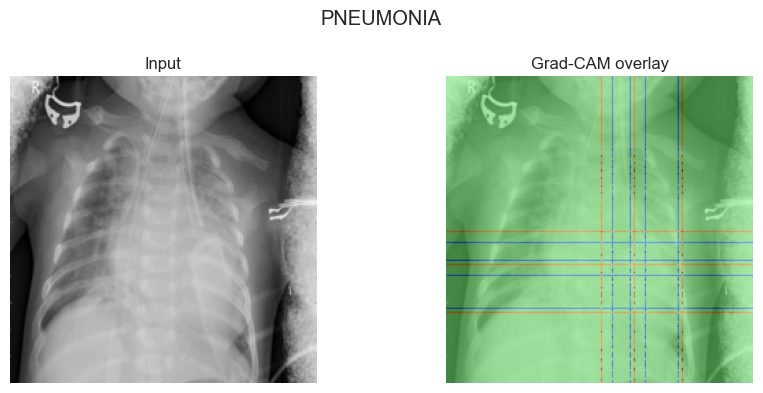

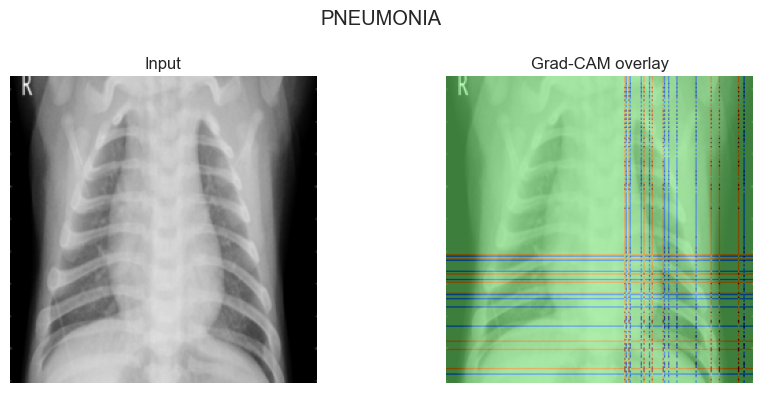

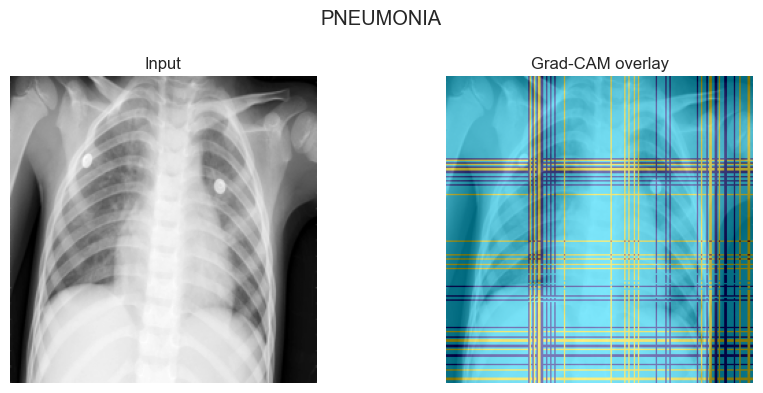

In [13]:
class CNNClassifierWithFeatures(CNNClassifier):
    def forward(self, x, return_features=False):
        features = self.features(x)
        logits = self.classifier(features).squeeze(1)
        if return_features:
            return logits, features
        return logits

gradcam_model = CNNClassifierWithFeatures().to(device)
gradcam_model.load_state_dict(model.state_dict())
gradcam_model.eval()

def grad_cam(model, input_tensor, target_class=1):
    model.eval()
    input_tensor = input_tensor.to(device)
    input_tensor.requires_grad_(True)
    logits, features = model(input_tensor, return_features=True)
    score = logits.sum()
    gradients = torch.autograd.grad(score, features, retain_graph=True)[0]
    weights = gradients.mean(dim=(2, 3), keepdim=True)
    cam = (weights * features).sum(dim=1, keepdim=True)
    cam = F.relu(cam)
    cam = F.interpolate(cam, size=input_tensor.shape[-2:], mode='bilinear', align_corners=False)
    cam = cam.squeeze().detach().cpu().numpy()
    cam = cam - cam.min()
    if cam.max() > 0:
        cam = cam / cam.max()
    return cam

def plot_cam(image_tensor, cam, title='', save_path=None):
    image = denormalize(image_tensor.detach().cpu()).squeeze().numpy()
    fig, axes = plt.subplots(1, 2, figsize=(9, 4))
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Input')
    axes[0].axis('off')
    axes[1].imshow(image, cmap='gray')
    axes[1].imshow(cam, cmap='jet', alpha=0.5)
    axes[1].set_title('Grad-CAM overlay')
    axes[1].axis('off')
    fig.suptitle(title)
    plt.tight_layout()
    if save_path is not None:
        Path('figures/part2').mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()

for idx, (_, row) in enumerate(pd.concat([healthy_samples, disease_samples]).iterrows()):
    image = Image.open(row['path']).convert('L')
    tensor = eval_transform(image).unsqueeze(0).to(device)
    cam = grad_cam(gradcam_model, tensor, target_class=1)
    label_short = 'normal' if row['label_name'] == 'NORMAL' else 'pneumonia'
    save_path = f"figures/part2/Q4_2_gradcam_{label_short}_{idx}.png"
    plot_cam(tensor, cam, title=row['label_name'], save_path=save_path)

## 6. Q5: Data Randomization Test

The next section retrains the CNN on randomly permuted labels and compares saliency maps against the trained model. This follows the spirit of the sanity checks paper.

In [14]:
random_train_df = train_df.copy()
random_train_df['label'] = np.random.permutation(random_train_df['label'].values)
random_train_dataset = ChestXrayDataset(random_train_df, transform=train_transform)
random_train_loader = DataLoader(random_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

random_model_base = CNNClassifier().to(device)
random_criterion = nn.BCEWithLogitsLoss(pos_weight=class_weights[1] / class_weights[0])
random_optimizer = torch.optim.Adam(random_model_base.parameters(), lr=1e-3)

def run_epoch_random(model, loader, optimizer=None):
    training = optimizer is not None
    model.train(training)
    losses = []
    for inputs, targets, _ in loader:
        inputs = inputs.to(device)
        targets = targets.float().to(device)
        if training:
            optimizer.zero_grad()
        logits = model(inputs)
        loss = random_criterion(logits, targets)
        if training:
            loss.backward()
            optimizer.step()
        losses.append(loss.item())
    return float(np.mean(losses))

for epoch in range(5):
    train_loss = run_epoch_random(random_model_base, random_train_loader, optimizer=random_optimizer)
    print({'epoch': epoch + 1, 'train_loss': train_loss})

random_model_base.eval()

random_model = CNNClassifierWithFeatures().to(device)
random_model.load_state_dict(random_model_base.state_dict())
random_model.eval()

{'epoch': 1, 'train_loss': 0.36081346448945123}
{'epoch': 2, 'train_loss': 0.3589741050100034}
{'epoch': 3, 'train_loss': 0.35696142016012977}
{'epoch': 4, 'train_loss': 0.35813839249084334}
{'epoch': 5, 'train_loss': 0.3569900058895532}


CNNClassifierWithFeatures(
  (features): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, 

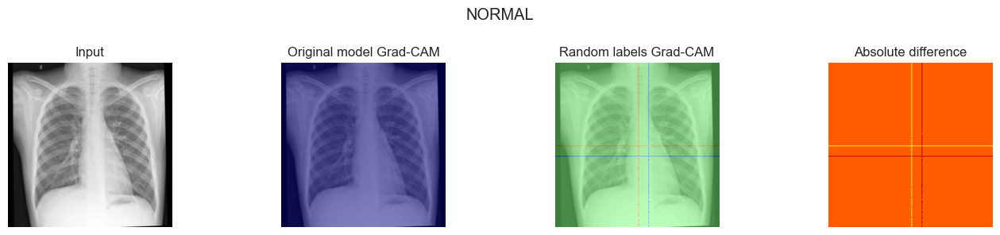

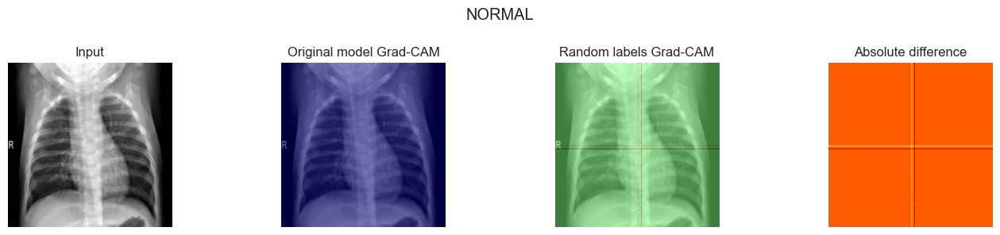

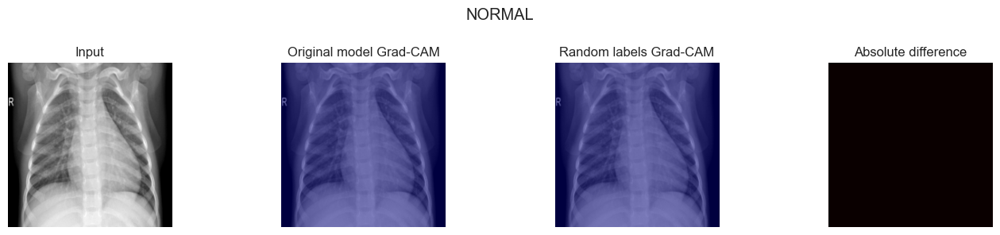

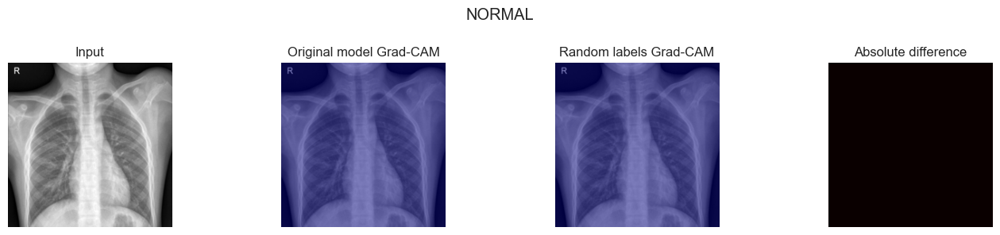

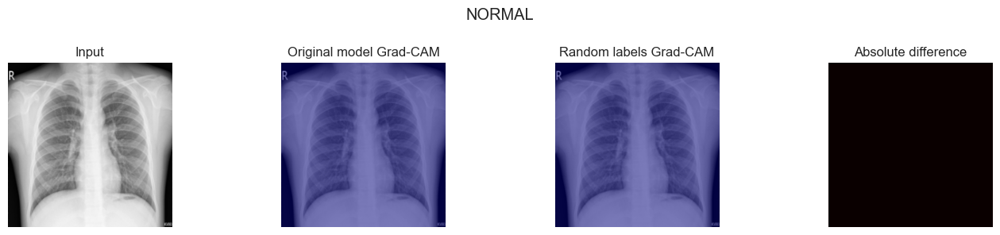

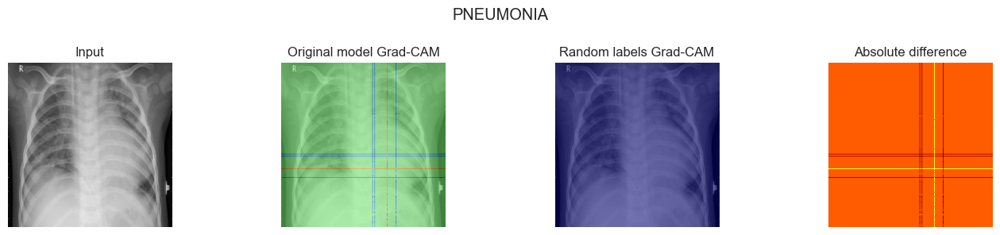

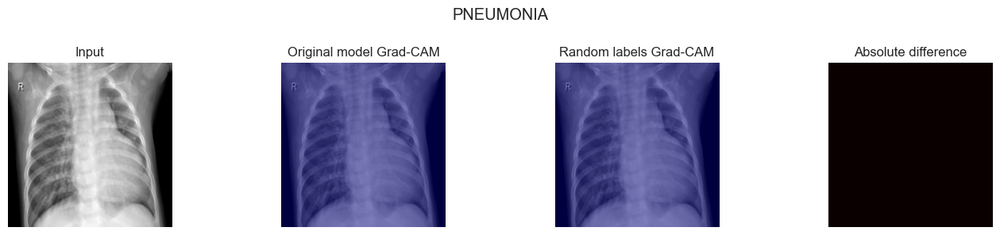

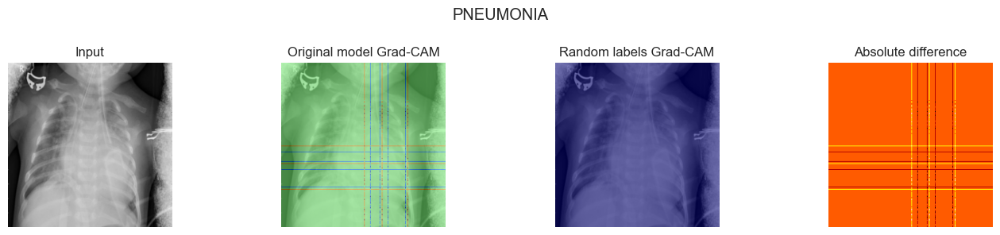

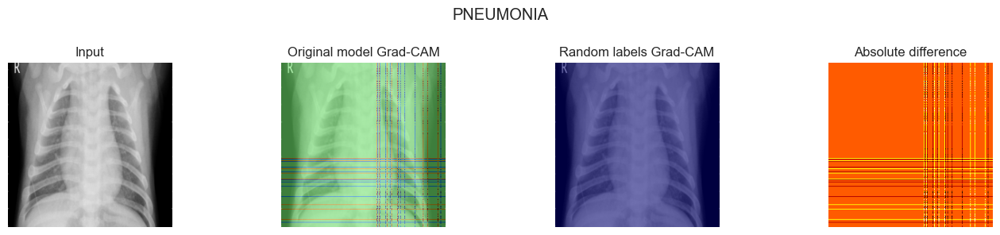

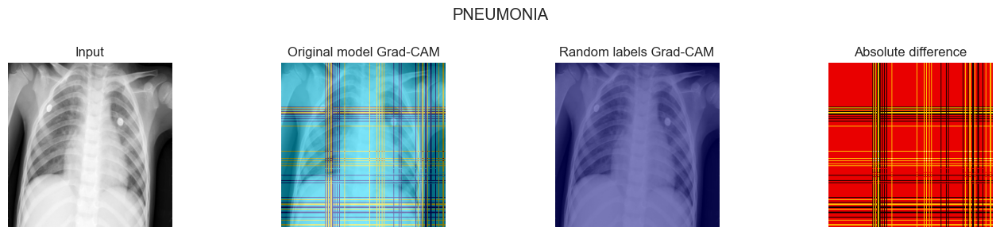

In [15]:
for idx, (_, row) in enumerate(pd.concat([healthy_samples, disease_samples]).iterrows()):
    image = Image.open(row['path']).convert('L')
    tensor = eval_transform(image).unsqueeze(0).to(device)
    cam_orig = grad_cam(gradcam_model, tensor, target_class=1)
    cam_rand = grad_cam(random_model, tensor, target_class=1)
    
    fig, axes = plt.subplots(1, 4, figsize=(14, 3))
    image_np = denormalize(tensor).squeeze().detach().cpu().numpy()
    
    axes[0].imshow(image_np, cmap='gray')
    axes[0].set_title('Input')
    axes[0].axis('off')
    
    axes[1].imshow(image_np, cmap='gray')
    axes[1].imshow(cam_orig, cmap='jet', alpha=0.5)
    axes[1].set_title('Original model Grad-CAM')
    axes[1].axis('off')
    
    axes[2].imshow(image_np, cmap='gray')
    axes[2].imshow(cam_rand, cmap='jet', alpha=0.5)
    axes[2].set_title('Random labels Grad-CAM')
    axes[2].axis('off')
    
    axes[3].imshow(np.abs(cam_orig - cam_rand), cmap='hot')
    axes[3].set_title('Absolute difference')
    axes[3].axis('off')
    
    fig.suptitle(f"{row['label_name']}")
    plt.tight_layout()
    Path('figures/part2').mkdir(parents=True, exist_ok=True)
    label_short = 'normal' if row['label_name'] == 'NORMAL' else 'pneumonia'
    plt.savefig(f"figures/part2/Q5_2_gradcam_randomization_{label_short}_{idx}.png", dpi=150, bbox_inches='tight')
    plt.show()

In [18]:
def integrated_gradients_model(model, input_tensor, baseline=None, target_class=1, steps=50, device_input=None):
    """Compute Integrated Gradients for original or random model."""
    if device_input is None:
        device_input = next(model.parameters()).device
    model.to(device_input)
    model.eval()

    if baseline is None:
        baseline = torch.zeros_like(input_tensor).to(device_input)
    else:
        baseline = baseline.to(device_input)

    input_tensor = input_tensor.to(device_input)

    # Generate scaled inputs
    scaled_inputs = [baseline + (float(k) / steps) * (input_tensor - baseline) for k in range(1, steps + 1)]
    scaled_batch = torch.cat(scaled_inputs, dim=0)

    scaled_batch.requires_grad = True

    # Forward pass
    logits = model(scaled_batch)
    # Handle binary classification output
    if logits.dim() == 1 or (logits.dim() == 2 and logits.shape[1] == 1):
        probs = torch.sigmoid(logits)
        if probs.dim() == 2:
            probs = probs.squeeze(1)
        scores = probs
    else:
        scores = torch.softmax(logits, dim=1)[:, target_class]

    # Backpropagate gradients
    grads = torch.autograd.grad(outputs=scores.sum(), inputs=scaled_batch, create_graph=False)[0]

    avg_grads = grads.mean(dim=0)

    # Integrated gradients
    delta = (input_tensor - baseline).squeeze(0).cpu()
    attr = delta * avg_grads.cpu()

    return attr.detach().numpy()

In [ ]:
# Q5.3: Integrated Gradients under label randomization
# Generate and save IG visualizations for the randomized model

def plot_attribution_comparison(image_tensor, attr_orig, attr_rand, title='', save_path=None):
    image = denormalize(image_tensor.detach().cpu()).squeeze().numpy()
    orig = attr_orig.squeeze()
    rand = attr_rand.squeeze()
    diff = np.abs(orig - rand)

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Input')
    axes[0].axis('off')

    axes[1].imshow(orig, cmap='seismic')
    axes[1].set_title('Original IG')
    axes[1].axis('off')

    axes[2].imshow(rand, cmap='seismic')
    axes[2].set_title('Randomized IG')
    axes[2].axis('off')

    axes[3].imshow(diff, cmap='magma')
    axes[3].set_title('Absolute difference')
    axes[3].axis('off')

    fig.suptitle(title)
    plt.tight_layout()

    if save_path is not None:
        Path('figures/part2').mkdir(parents=True, exist_ok=True)
        plt.savefig(save_path, dpi=150, bbox_inches='tight')

    plt.show()


for idx, (_, row) in enumerate(pd.concat([healthy_samples, disease_samples]).iterrows()):
    image = Image.open(row['path']).convert('L')
    tensor = eval_transform(image).unsqueeze(0).to(device)

    attr_orig = integrated_gradients_model(model, tensor, baseline=torch.zeros_like(tensor), target_class=1, steps=32, device_input=device)
    attr_rand = integrated_gradients_model(random_model, tensor, baseline=torch.zeros_like(tensor), target_class=1, steps=32, device_input=device)

    label_short = 'normal' if row['label_name'] == 'NORMAL' else 'pneumonia'
    save_path = f"figures/part2/Q5_3_integrated_gradients_randomization_{label_short}_{idx}.png"
    plot_attribution_comparison(tensor, attr_orig, attr_rand, title=row['label_name'], save_path=save_path)